<h2>Darwin Mendez - 2023-0769</h2>
<h2 style="color: blue; text-align: center;">Deep Learning</h2>

In [ ]:
!pip install tf_keras

In [ ]:
from google.colab import drive

In [ ]:
# 1. Montar mi Drive
drive.mount('/content/drive')
import numpy as np

Mounted at /content/drive


# Clasificación End-to-End Multiclase de Razas de Perros

Este cuaderno construye un clasificador de imágenes de principio a fin utilizando TensorFlow 2.0 y TensorFlow Hub.

## 1. Problema

Identificar la raza de un perro dada una imagen del mismo.

Cuando estoy sentado en la cafetería y tomo una foto de un perro, quiero saber de qué raza es.

## 2. Datos

Los datos que estamos utilizando provienen de la competencia de identificación de razas de perros de Kaggle.

https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluación

La evaluación consiste en un archivo con probabilidades de predicción para cada imagen de prueba de raza.

## 4. Características

Algunas informaciones sobre los datos:

* Estamos trabajando con imágenes (datos no estructurados), por lo que probablemente lo mejor sea usar deep/transfer learning.
* Hay 120 razas de perros (esto significa que existen 120 clases diferentes).
* Hay alrededor de 10,000+ imágenes en el conjunto de entrenamiento (estas imágenes tienen etiquetas).

In [ ]:
# Unzip the data folder
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip"  -d "drive/MyDrive/Dog Vision"

## Preparar nuestro espacio de trabajo
* Importar TensorFlow ✅
* Importar TensorFlow Hub ✅
* Asegurarse de que estamos usando una GPU

In [ ]:
# Import TF 2.x

try:
  # %tensorflow_version only exists in Colab
  %tensorflow_version 2.x
  #%tensorflow_hub_version 0.7x
except Exception:
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
# Import nessecary tools
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tf_keras
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)
print("\nGPU", "available" if tf.config.list_physical_devices("GPU") else "not available ):")

TF version: 2.19.0
TF Hub version: 0.16.1

GPU not available ):


## Preparando nuestros Datos (Convirtiéndolos en tensores)

Con todos los modelos de machine learning, nuestros datos deben estar en formato numérico. Así que eso es lo que haremos (representaciones numéricas).


In [ ]:
# Checkout the labels of our data

import pandas as pd
#/content/drive/MyDrive/Dog Vision/labels.csv
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:

labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'petroff10',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

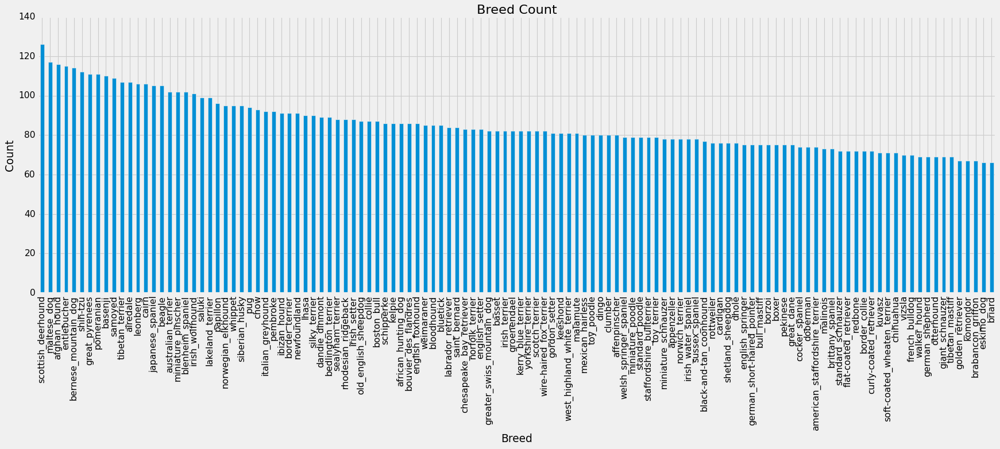

In [ ]:
# How many images are there of each bread
plt.style.use('fivethirtyeight')
fig, ax = plt.subplots(figsize=(22,10))
labels_csv["breed"].value_counts().plot.bar(ax=ax)


ax.set(
    title="Breed Count",
    xlabel="Breed",
    ylabel="Count"
)

plt.tight_layout()
plt.show()

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
# view image inside the notebook.

from IPython.display import Image

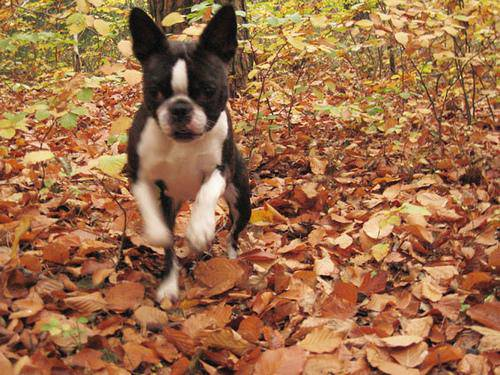

In [ ]:
Image("drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Obteniendo Imágenes y sus etiquetas

Vamos a obtener una lista de las rutas de nuestras imágenes


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["/content/drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

filenames[:3]

['/content/drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg']

In [ ]:
# Check whether nuber of filenames matches number of actual image files
import os

if len(os.listdir("/content/drive/MyDrive/Dog Vision/train")) == len(filenames):
  print("Filenames match actual amount of data")
else:
  print("Filenames do not match actual amount of data")

Filenames match actual amount of data


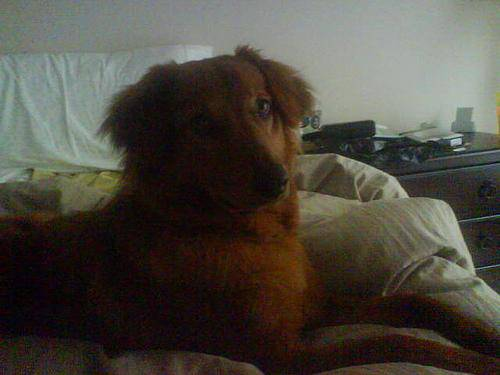

In [ ]:
from IPython.display import Image
# One check
Image(filenames[1000])

Let's prepare the labels

In [ ]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames

if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames!")

Number of labels matches number of filenames!


In [ ]:
# Find unique label values
unique_breeds = np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# turn a single row i[nto an array of booleans
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

len(boolean_labels)

10222

In [ ]:
# Turning boolean arrays into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[1])
print(boolean_labels[1].astype(int))

dingo
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Since the dataset doesn't come with validatin set, we'll do it here.

In [ ]:
X = filenames
y = boolean_labels

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Let's start experimenting with 1000 and then we'll increase as needed

In [ ]:
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000}

In [ ]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:3], y_train[:3]

(['/content/drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, 

### Preprocesamiento de Imágenes (Convirtiendo imágenes en tensores)

Escribamos una función que haga varias cosas:
1. Tomar la ruta de un archivo de imagen.
2. Usar TensorFlow para leer el archivo y guardarlo en una variable `image`.
3. Convertir nuestra `image` (un jpg) en tensores.
4. Redimensionar la `image` a una forma de (244, 244).
5. Retornar la `image` modificada.

Antes de hacerlo, veamos cómo se ve al importar una imagen.

In [ ]:
# Converts image to Numpy array

from matplotlib.pyplot import imread

image = imread(filenames[33])
image.shape

(500, 443, 3)

In [ ]:
r, g, b = image[0][0]
print(f"Red: {r}, Green: {g}, Blue: {b}")

Red: 203, Green: 203, Blue: 201


In [ ]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [ ]:
#turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 443, 3), dtype=uint8, numpy=
array([[[203, 203, 201],
        [187, 187, 185],
        [184, 184, 182],
        ...,
        [ 84,  74,  38],
        [ 88,  79,  40],
        [ 85,  76,  35]],

       [[163, 163, 161],
        [212, 212, 210],
        [163, 163, 161],
        ...,
        [ 80,  71,  32],
        [ 86,  77,  38],
        [ 86,  77,  36]]], dtype=uint8)>

Ahora hagamos una función para preprocesarlas

1. Tomar la ruta de un archivo de imagen.
2. Usar TensorFlow para leer el archivo y guardarlo en una variable `image`.
3. Convertir nuestra `image` (un jpg) en tensores.
4. Normalizar la `image` de 0-255 a 0-1.
5. Redimensionar la `image` a una forma de (244, 244).
6. Retornar la `image` modificada.


In [ ]:
IMG_SIZE = 224

# Create a function for preprocessing images

def process_image(image_path:str, image_size=IMG_SIZE)-> tf.Tensor:
  """
    Takes an image file path and turns the image into a Tensor.
  """

  # read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # resize the image to our desired size (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
#process_image()

In [ ]:
tensor = tf.io.read_file(filenames[22])

tensor = tf.image.decode_jpeg(tensor, channels=3)

tensor = tf.image.convert_image_dtype(tensor, tf.float32)
#tensor
tensor.dtype

tf.float32

## Convirtiendo nuestros datos en lotes

¿Por qué convertir nuestros datos en lotes?

Imagina que estás procesando más de 10,000 imágenes de una sola vez... es posible que no todas quepan en memoria.

Por eso procesamos alrededor de 32 imágenes a la vez (este es el tamaño del lote, el cual puedes ajustar manualmente si es necesario).

Para usar TensorFlow de manera efectiva, necesitamos que nuestros datos estén en forma de tuplas de tensores que se vean así: `(image, label)`

In [ ]:
# Create a function to return a tuple of tensors
def get_image_label(image_path, label):
  """
    Takes an image file path name and the associated label,
    processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[0]), tf.constant(y[0]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.5705322 , 0.33588538, 0.15008473],
         [0.66901225, 0.4601166 , 0.26022965],
         [0.61062384, 0.43763596, 0.21601713],
         ...,
         [0.8182312 , 0.7297958 , 0.26963907],
         [0.72454786, 0.6059109 , 0.2653059 ],
         [0.7494603 , 0.6252918 , 0.32456532]],
 
        [[0.6761415 , 0.4733761 , 0.30642927],
         [0.5672121 , 0.38192675, 0.20349538],
         [0.5883547 , 0.4322571 , 0.2403155 ],
         ...,
         [0.9326942 , 0.8260503 , 0.41093278],
         [0.86072475, 0.74250627, 0.3694122 ],
         [0.76781666, 0.6461604 , 0.29291284]],
 
        [[0.46350825, 0.29595745, 0.1536156 ],
         [0.42554107, 0.27039403, 0.12009468],
         [0.7887875 , 0.6547362 , 0.49015   ],
         ...,
         [0.89372385, 0.7696401 , 0.41811958],
         [0.88609535, 0.7585918 , 0.36495727],
         [0.8243601 , 0.69494826, 0.2930575 ]],
 
        ...,
 
        [[0.7344025 , 0.4716574 

Ahora que tenemos una forma de convertir nuestros datos en tuplas de tensores con el formato: `(image, label)`, hagamos una función para convertir todos nuestros datos (x & y) en lotes.


In [ ]:
BATCH_SIZE = 32;

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
    Also accepts test data as input (no labels).

  """

  # if the data is a test dataset, we probabbly don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    # shuffle
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels

    # Shuffling
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (also turns the image patch into a preprocessed image)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizando Lotes de Datos

Nuestros datos ahora están en lotes; sin embargo, a veces pueden ser difíciles de entender. Vamos a visualizarlos.

In [ ]:
def view_data_batch(images, labels):
  """
    Receives and displays half a batch of images and their labels.

  """

  fig, axes = plt.subplots(4, 4, figsize=(10,10))

  axes = axes.flatten()

  for i in range(16):
    for i, ax in enumerate(axes):
      ax.imshow(images[i])
      ax.set(
          title=unique_breeds[labels[i].argmax()],
          xticks=[],
          yticks=[]
      )

  plt.tight_layout()
  plt.show()

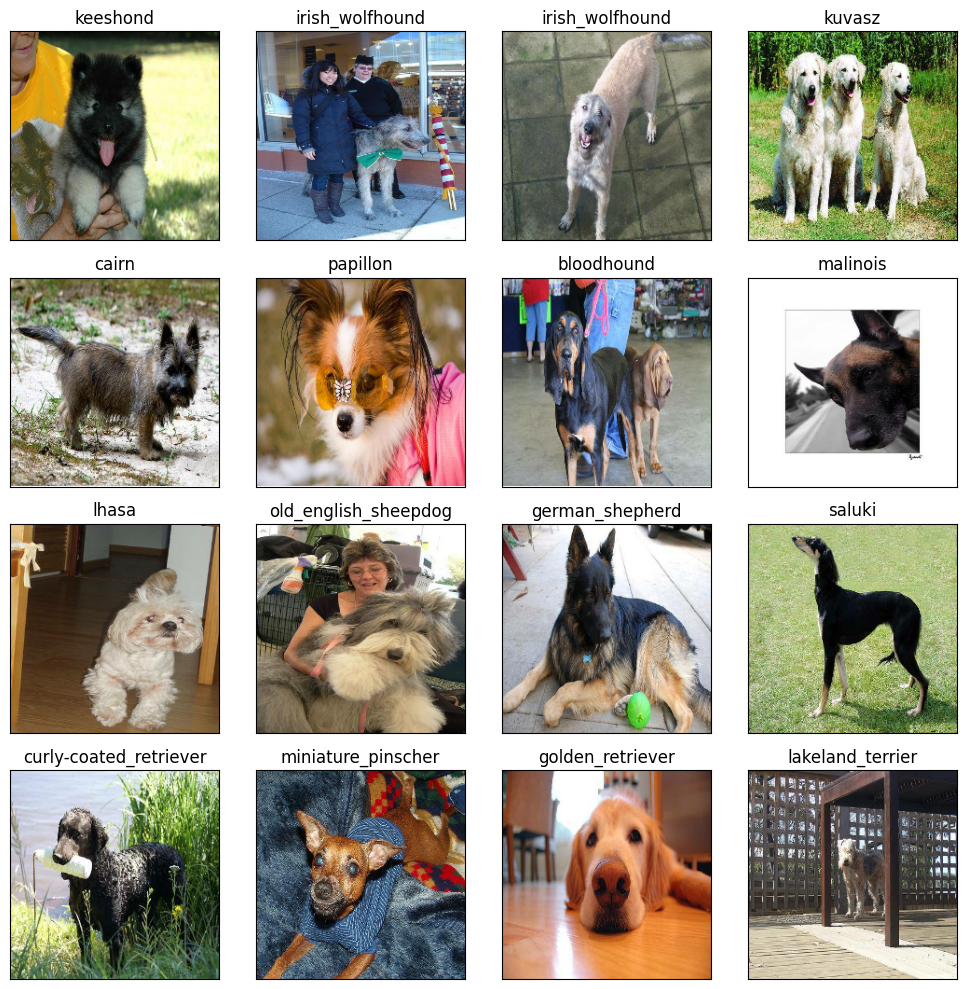

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
view_data_batch(train_images, train_labels)

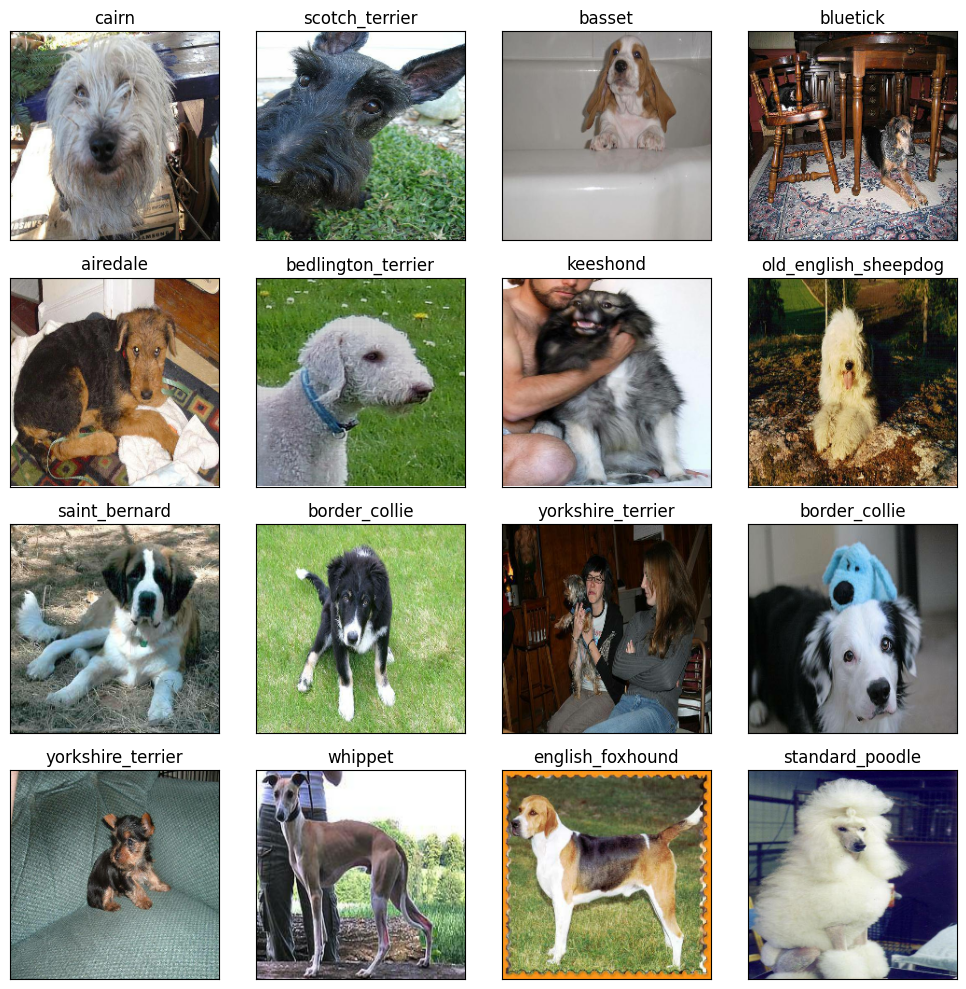

In [ ]:
# Let's now visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())

view_data_batch(val_images, val_labels)

## Construyendo un Modelo

Antes de construir un modelo, hay algunas cosas que necesitamos definir:
* La forma de entrada (la forma de nuestras imágenes, en forma de tensores) para nuestro modelo.
* La forma de salida (etiquetas de imágenes, en forma de tensores) de nuestro modelo.
* La URL del modelo que queremos usar.

In [ ]:
# Setup input shape to our model
INPUT_SHAPE =  [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1"

Ahora que tenemos nuestras entradas, salidas y el modelo listos, ¡juntemos todo en un modelo de deep learning con Keras!

Sabiendo esto, creemos una función que:
* Tome como parámetros la forma de entrada, la forma de salida y el modelo que hemos elegido.
* Defina las capas en un modelo de Keras de forma secuencial (haz esto primero, luego esto, luego aquello).
* Compile el modelo (indica cómo debe evaluarse y mejorarse).
* Construya el modelo (le especifica la forma de entrada que recibirá).
* Devuelva el modelo.


In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", model_url)
  # Setup the model layers
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf_keras.layers.Dense(units=output_shape,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
      )  # Build the model

  model.build(input_shape)   # Let the model know what kind of inputs it'll be getting


  return model



In [ ]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creando Callbacks

Los *callbacks* son funciones auxiliares que un modelo puede usar durante el entrenamiento para cosas como guardar su progreso, verificar su estado o detener el entrenamiento temprano si deja de mejorar.

Crearemos dos callbacks: uno para **TensorBoard**, que ayuda a rastrear el progreso del modelo, y otro de **early stopping**, que evita que el modelo entrene por demasiado tiempo.

### Callback de TensorBoard

Para configurar un callback de TensorBoard necesitamos hacer tres cosas:

1. Cargar la extensión de cuaderno de TensorBoard ✅  
2. Crear un callback de TensorBoard que pueda guardar *logs* en un directorio y pasarlo a la función `fit()` de nuestro modelo.  
3. Visualizar la pérdida de entrenamiento del modelo con la función mágica `tensorboard` (lo haremos después del entrenamiento del modelo).

In [ ]:
# Load Tensorboard Notebook Extension
%load_ext tensorboard

In [ ]:
import datetime
import os

# Create a function  to build Tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf_keras.callbacks.TensorBoard(logdir)

### Callback de Early Stopping

El *early stopping* ayuda a evitar que nuestro modelo caiga en sobreajuste deteniendo el entrenamiento si una métrica de evaluación determinada deja de mejorar.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping?hl=es


In [ ]:
# Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

## Entrenando un modelo (en un subconjunto de datos)

Nuestro primer modelo solo se entrenará con 1000 imágenes para asegurarnos de que todo esté funcionando.


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU

print("GPU", "Available YES!" if tf.config.list_physical_devices("GPU") else "not available ):")

GPU Available YES!


Ahora creemos una función que entrene un modelo.

* Crear un modelo usando `create_model()`.
* Configurar un callback de TensorBoard usando `create_tensorboard_callback()`.
* Llamar a la función `fit()` de nuestro modelo pasando los datos de entrenamiento, los datos de validación, el número de épocas a entrenar `(NUM_EPOCHS)` y los callbacks que queremos usar.
* Devolver el modelo.

In [ ]:
# Build a function to train and return the trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(
      x=train_data,
      epochs=NUM_EPOCHS,
      validation_data=val_data,
      validation_freq=1,
      callbacks=[tensorboard, early_stopping]
  )

  # return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 158s 6s/step - loss: 4.5680 - accuracy: 0.0913 - val_loss: 3.3363 - val_accuracy: 0.2950
Epoch 2/100
25/25 [==============================] - 4s 153ms/step - loss: 1.6182 - accuracy: 0.6812 - val_loss: 2.1278 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 187ms/step - loss: 0.5592 - accuracy: 0.9325 - val_loss: 1.6500 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 3s 129ms/step - loss: 0.2492 - accuracy: 0.9887 - val_loss: 1.4868 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 3s 133ms/step - loss: 0.1436 - accuracy: 0.9975 - val_loss: 1.4230 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 176ms/step - loss: 0.0993 - accuracy: 0.9987 - val_loss: 1.3923 - val_accuracy: 0.6400
Epoch 7/100
25/25 [===============

**Pregunta**: Parece que nuestro modelo está cayendo en sobreajuste porque tiene un desempeño mucho mejor en el conjunto de entrenamiento que en el conjunto de validación. ¿Exploremos algunas formas de prevenir el sobreajuste en redes neuronales profundas?

**Nota**: ¡El sobreajuste al inicio es algo bueno! Significa que nuestro modelo está aprendiendo.

### Revisando los registros de TensorBoard

La función mágica de TensorBoard (`%tensorboard`) accederá al directorio de *logs* que creamos anteriormente y visualizará su contenido.


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 104ms/step


array([[4.52860864e-03, 4.35407797e-04, 1.93776435e-03, ...,
        2.22982460e-04, 4.96509892e-06, 3.16926371e-03],
       [1.42844301e-03, 6.12178585e-04, 2.86704637e-02, ...,
        3.47298046e-04, 6.22237241e-03, 7.47170416e-05],
       [8.50938432e-06, 8.61959779e-06, 1.39007889e-05, ...,
        7.96729146e-05, 1.37018242e-05, 9.29080707e-05],
       ...,
       [5.14343765e-06, 1.04350838e-05, 8.83196262e-05, ...,
        1.25275465e-05, 3.66200184e-05, 1.70519546e-04],
       [1.24076521e-03, 1.91330546e-04, 2.52206246e-05, ...,
        1.33850015e-04, 1.93417127e-05, 7.03858072e-03],
       [2.23431241e-04, 1.27533194e-05, 2.54431798e-04, ...,
        1.46855682e-03, 1.17286174e-04, 7.44220915e-06]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(y_val)

200

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

np.float32(1.0)

In [ ]:
# First Prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}")

[4.52860864e-03 4.35407797e-04 1.93776435e-03 5.82140055e-05
 4.34572685e-05 1.37426599e-04 2.34821513e-02 1.88666643e-04
 4.54217457e-04 6.23031810e-04 1.00295176e-03 5.06439610e-05
 3.04195622e-04 3.95556890e-05 5.28626377e-04 9.89920343e-04
 5.99333842e-04 2.16013849e-01 2.15474552e-06 4.03210106e-05
 5.69312018e-04 1.15746385e-04 1.00903326e-05 1.64680672e-03
 4.09380533e-04 7.36499613e-04 2.60271221e-01 3.96065734e-05
 8.52135476e-04 6.42757368e-05 1.35969400e-04 1.63634191e-03
 7.56661349e-04 7.88492616e-06 1.37457348e-04 6.96631661e-03
 1.74128636e-05 1.86658290e-04 8.96010533e-05 2.14764204e-05
 2.25427863e-03 3.68683795e-05 1.06007246e-04 2.29343466e-04
 1.15759076e-05 4.84360935e-05 2.16972112e-05 9.52519331e-05
 3.35425924e-04 4.20639321e-04 2.77589657e-04 5.65018381e-05
 6.30045368e-04 1.01096979e-04 3.77313496e-04 3.58982143e-05
 4.27043633e-05 1.20091939e-03 2.57473701e-04 1.56593055e-01
 7.32299814e-05 6.42234736e-05 3.26294801e-04 9.55870710e-05
 1.81493800e-04 8.757697

Tener la funcionalidad anterior es genial, pero queremos poder hacerlo a gran escala.

¡Y sería aún mejor si pudiéramos ver la imagen sobre la cual se está haciendo la predicción!  
**Nota**: Las probabilidades de predicción también se conocen como niveles de confianza.

In [ ]:
# Turn prediction probabilitoes into their respective label (Easier to understand)


def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label (Dog breed).

  Example:
    pred_label = get_pred_label(predictions[0])
    pred_label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]


# Get a predicted label based on an array of prediction probabilities


Ahora, como nuestros datos de validación aún están en un conjunto por lotes, tendremos que "desagruparlos" para obtener predicciones sobre las imágenes de validación y luego comparar esas predicciones con las etiquetas de validación (etiquetas reales).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a dataset

def unbatchify(data):
  """
    Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images = []
  labels = []


  # Loop Through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(
        unique_breeds[np.argmax(label)]
    )

  return images, labels


val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Ahora tenemos formas de obtener:
- Etiquetas de predicción
- Etiquetas de validación (etiquetas reales)
- Imágenes de validación

Hagamos algunas funciones para visualizar todo esto un poco mejor.

Crearemos una función que:
- Tome un arreglo de probabilidades de predicción, un arreglo de etiquetas reales y un arreglo de imágenes e enteros.
- Convierta las probabilidades de predicción en una etiqueta predicha.
- Grafique la etiqueta predicha, su probabilidad predicha, la etiqueta real y la imagen objetivo en una sola gráfica.


In [ ]:
def plot_pred(prediction_probabilities, true_labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """

  pred_prob, true_label, image = prediction_probabilities[n], true_labels[n], images[n]


  # Get the pred label
  pred_label = get_pred_label(pred_prob)


  color="green" if pred_label == true_label else "red"

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  plt.title(

            "{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),
            color=color
  )

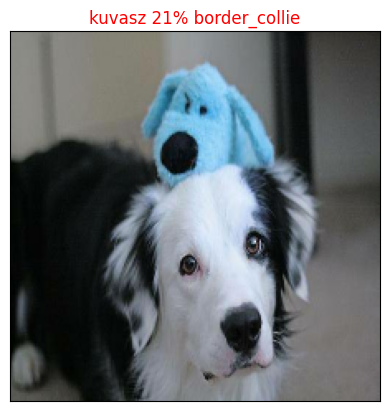

In [ ]:
plot_pred(
    prediction_probabilities=predictions,
    true_labels=val_labels,
    images=val_images,
    n=11
)

Ahora que tenemos una función para visualizar la predicción, hagamos otra para ver las 10 mejores predicciones de nuestro modelo.

Esta función:
- Tomará como entrada las probabilidades de predicción, un arreglo de etiquetas verdaderas y un entero.
- Encontrará la predicción usando `get_pred_label()`.
- Hallará el top 10 de:
  - Índices de las probabilidades de predicción
  - Valores de las probabilidades de predicción
  - Etiquetas de predicción
- Graficará los 10 valores de probabilidad de predicción principales y sus etiquetas, coloreando de verde la etiqueta verdadera.


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top n highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setear plot
  top_plot = plt.bar(
      np.arange(len(top_10_pred_labels)),
      top_10_pred_values,
      color="grey",
  )


  plt.xticks(
      np.arange(len(top_10_pred_labels)),
      top_10_pred_labels,
      rotation="vertical"
  )


  # Set the title
  if np.isin(pred_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == pred_label)].set_color("green")
    plt.title(f"Predicted: {pred_label} | Truth: {true_label}")
  else:
    pass

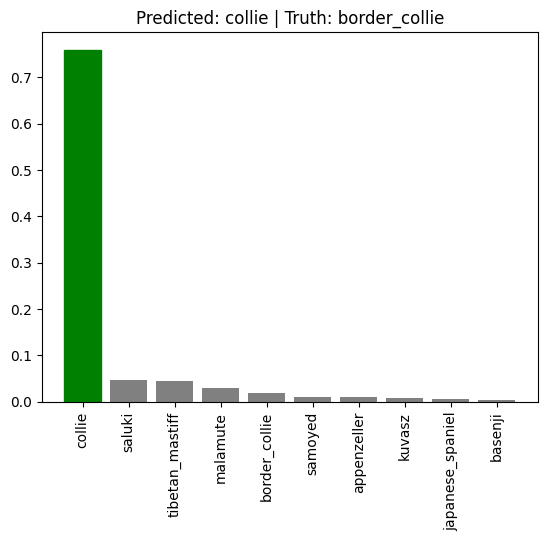

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

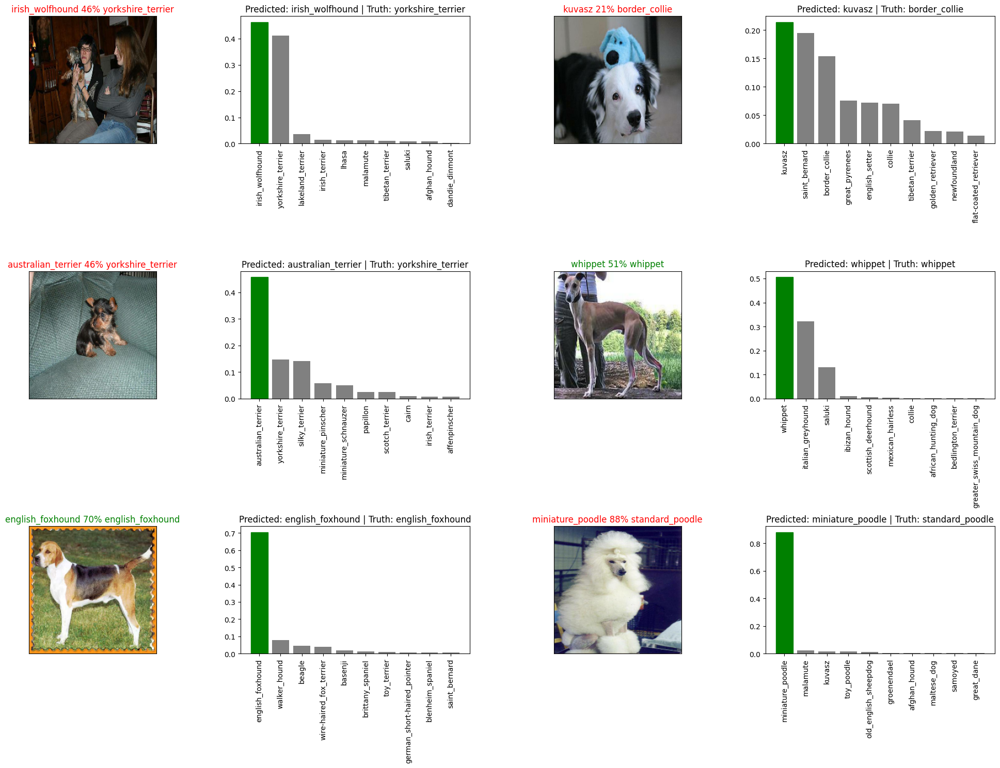

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            true_labels=val_labels,
            images=val_images,
            n=i+i_multiplier
            )
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier
                 )
plt.tight_layout(h_pad=1.0)
plt.show()

### Guardando y Recargando un modelo entrenado

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str) for clarity.
  """
  # Create a model directory pathname with current time.

  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving moodel to: {model_path}...")
  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")

  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})

  return model

Ahora que tenemos funciones, usemoslas!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving moodel to: drive/MyDrive/Dog Vision/models/20250819-18251755627951-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250819-18251755627951-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20250819-18251755627951-1000-images-mobilenetv2-Adam.h5")

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 1.2519 - accuracy: 0.6900


[1.2519402503967285, 0.6899999976158142]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2955 - accuracy: 0.6650


[1.295499324798584, 0.6650000214576721]

## Entrenando un modelo supergrande

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Create a data batch with the full dataset.

full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No bvalidation set when training all the data, so we can't onitor validation accuracy

full_model_early__stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early__stopping]
)

Epoch 1/100
320/320 [==============================] - 42s 115ms/step - loss: 1.3351 - accuracy: 0.6729
Epoch 2/100
320/320 [==============================] - 38s 118ms/step - loss: 0.3962 - accuracy: 0.8854
Epoch 3/100
320/320 [==============================] - 38s 120ms/step - loss: 0.2360 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 39s 120ms/step - loss: 0.1535 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 37s 115ms/step - loss: 0.1052 - accuracy: 0.9793
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0778 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0597 - accuracy: 0.9899
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0453 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0369 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 38s 120m

## Haciendo predicciones en el conjunto de prueba

Como nuestro modelo se ha entrenado con imágenes en forma de lotes de tensores, para hacer predicciones sobre los datos de prueba debemos usar el mismo formato.

Por suerte, antes creamos `create_data_batches()`, que puede tomar una lista de nombres de archivo como entrada y convertirlos en lotes de tensores.

Para hacer predicciones en los datos de prueba, vamos a:
- Obtener los nombres de archivo de las imágenes de prueba.
- Convertir los nombres de archivo en lotes de datos de prueba usando `create_data_batches()` y estableciendo el parámetro `test_data` en `True` (ya que los datos de prueba no tienen etiquetas).
- Crear un arreglo de predicciones pasando los lotes de prueba al método `predict()` del modelo.


In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving moodel to: drive/MyDrive/Dog Vision/models/20250819-19011755630086-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20250819-19011755630086-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
full_model_loaded =  load_model("drive/MyDrive/Dog Vision/models/20250819-19011755630086-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20250819-19011755630086-full-image-set-mobilenetv2-Adam.h5


In [ ]:
test_path = "drive/MyDrive/Dog Vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e4729bf465eac43afb6b04687d4703c3.jpg',
 'drive/MyDrive/Dog Vision/test/e43f6e621469f438f351d31d889b839f.jpg',
 'drive/MyDrive/Dog Vision/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 'drive/MyDrive/Dog Vision/test/e487437a727b3e4f0b919c878d39ae6e.jpg',
 'drive/MyDrive/Dog Vision/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 'drive/MyDrive/Dog Vision/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/MyDrive/Dog Vision/test/e7b357150635c250757363718e4dae86.jpg',
 'drive/MyDrive/Dog Vision/test/e16c4485a37ac90e1623e2da77513648.jpg',
 'drive/MyDrive/Dog Vision/test/e5b14b20ee8ac070bf5cea3b640f3dde.jpg',
 'drive/MyDrive/Dog Vision/test/ddbb53bb7ea7060847a0bd4554877e80.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Nota**: Llamar a `predict()` en nuestro modelo completo y pasarle el lote de datos de prueba tomará mucho tiempo en ejecutarse (alrededor de 1 hora).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = full_model_loaded.predict(test_data, verbose=1)

324/324 [==============================] - 193s 579ms/step


In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

In [ ]:
#np.savetxt("drive/MyDrive/Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/test_predictions.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

### Preparando las predicciones del conjunto de prueba para Kaggle

Al revisar el ejemplo de envío de Kaggle, vemos que requiere que las salidas de probabilidades de predicción de nuestro modelo estén en un DataFrame con una columna **ID** y una columna para **cada** raza de perro.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

Para obtener los datos en este formato, haremos lo siguiente:
* Crear un DataFrame de **pandas** con una columna **ID** y una columna para cada raza de perro.
* Agregar datos a la columna **ID** extrayendo los **ID** de las imágenes de prueba desde sus rutas de archivo.
* Agregar datos (las **probabilidades de predicción**) a cada una de las columnas de razas de perro.
* Exportar el DataFrame como **CSV** para enviarlo a Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
# Append test image IDs to the dataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
test_ids[:10]

['e4729bf465eac43afb6b04687d4703c3',
 'e43f6e621469f438f351d31d889b839f',
 'dcfd3463e1d23d51b309b0385292870b',
 'e487437a727b3e4f0b919c878d39ae6e',
 'e0072c3d9bee718b68ff1cf964a52536',
 'e587c21aedc81f89b83dd326e034e7e0',
 'e7b357150635c250757363718e4dae86',
 'e16c4485a37ac90e1623e2da77513648',
 'e5b14b20ee8ac070bf5cea3b640f3dde',
 'ddbb53bb7ea7060847a0bd4554877e80']

In [ ]:
preds_df["id"] = test_ids

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4729bf465eac43afb6b04687d4703c3,2.230473e-07,5.123997e-09,9.626328e-10,2.583543e-10,9.864873e-11,2.242195e-10,3.788028e-08,1.037744e-10,7.339314e-12,...,1.269274e-11,2.055510e-10,5.627894e-11,4.615091e-10,2.662623e-09,2.463239e-12,1.539128e-09,9.057197e-11,5.105245e-10,8.800996e-12
1,e43f6e621469f438f351d31d889b839f,2.631644e-12,6.560878e-11,1.059133e-12,6.107613e-11,4.331781e-11,3.094461e-11,4.317255e-11,2.882234e-10,9.999999e-01,...,5.359978e-13,6.863225e-12,1.412946e-10,1.112767e-08,8.122906e-12,1.332804e-07,3.270550e-10,3.632695e-10,1.605331e-10,1.016676e-12
2,dcfd3463e1d23d51b309b0385292870b,1.148957e-10,9.993186e-01,2.600362e-09,1.736010e-07,5.908409e-10,5.178186e-10,1.244015e-09,5.528903e-10,1.354264e-11,...,1.181121e-10,6.817817e-12,6.701528e-11,1.413149e-08,8.025997e-09,5.440998e-09,3.480754e-11,1.250527e-07,3.393726e-08,1.008100e-08
3,e487437a727b3e4f0b919c878d39ae6e,9.999826e-01,4.836790e-12,5.556612e-11,1.297447e-12,3.978802e-12,3.299235e-12,1.996928e-08,2.025742e-12,1.810973e-11,...,5.957809e-10,2.984567e-10,5.903096e-10,1.006006e-12,7.660395e-12,3.986423e-15,7.793546e-13,1.114690e-13,1.824204e-07,5.470843e-10
4,e0072c3d9bee718b68ff1cf964a52536,1.493205e-09,1.415136e-08,1.327200e-09,3.022058e-09,1.128544e-08,5.174152e-08,6.973966e-10,1.079672e-08,1.346712e-03,...,1.616854e-09,3.165315e-05,2.491265e-05,1.945281e-03,1.051073e-07,4.202509e-10,2.069210e-10,1.223436e-05,3.073709e-09,3.156149e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07e62ee044a6b7d6a45e92c65ff44f4e,4.495270e-12,4.511171e-11,5.854889e-09,8.868573e-10,3.504921e-07,7.121965e-11,1.491442e-11,5.893402e-11,2.025681e-09,...,6.373378e-08,1.240663e-11,9.535975e-04,4.814633e-08,9.983601e-01,1.307435e-11,2.554218e-09,1.368319e-10,1.488180e-11,7.591754e-07
10353,0910c194c44f79721d282c8416016dab,9.840663e-07,4.883588e-08,8.583396e-08,1.964815e-07,5.417164e-02,5.995477e-07,1.361751e-07,5.999867e-08,2.242741e-05,...,5.504749e-06,8.506478e-08,5.095981e-06,2.077083e-08,2.614009e-04,3.668688e-10,4.075111e-11,2.342908e-05,6.752820e-07,6.970726e-05
10354,07e4edc428816ffe6b8dd1024bed2782,3.368672e-04,2.727642e-07,1.750339e-06,1.685560e-05,1.559659e-08,2.924233e-08,9.018890e-07,5.064760e-08,7.177984e-10,...,3.038924e-06,9.836199e-07,3.999881e-08,6.194654e-08,4.682947e-09,4.488887e-10,1.674795e-06,4.207135e-06,3.656458e-07,6.143226e-05
10355,07165cea9be18c57a340345c02a3e885,2.148113e-11,4.724019e-12,1.359870e-11,3.618684e-11,1.908846e-02,3.089982e-10,3.152140e-10,2.374460e-10,3.760272e-12,...,2.512238e-10,2.698556e-10,3.934453e-12,4.686340e-10,2.804125e-12,9.029436e-14,2.864402e-10,8.886129e-09,4.675524e-08,4.102139e-12


In [ ]:
# Save the predictions df for submission to kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_preds_submit_01.csv", index=False)

## Haciendo predicciones en imágenes personalizadas

Para hacer predicciones en imágenes personalizadas vamos a:
- Obtener las rutas de archivo de nuestras propias imágenes.
- Convertir las rutas de archivo en lotes de datos usando `create_data_batches()`. Y como nuestras imágenes personalizadas no tendrán etiquetas, establecemos el parámetro `test_data` en `True`.
- Pasar el lote de datos de imágenes personalizadas al método `predict()` de nuestro modelo.
- Convertir las probabilidades de salida de las predicciones en etiquetas de predicción.
- Comparar las etiquetas predichas con las imágenes personalizadas.


In [ ]:
# Get custom image filepaths

custom_path = "drive/MyDrive/Dog Vision/my-dog-photos"
custom_image_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/my-dog-photo.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/my-dog-photo-1.jpg']

In [ ]:
# Turn custom images into batch dataset

custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_preds = full_model_loaded.predict(custom_data)

Creating test data batches...
1/1 [==============================] - 1s 513ms/step


In [ ]:
# Preds
list(map(get_pred_label, custom_preds))

['chihuahua', 'norwegian_elkhound']

In [ ]:
# Get custom images (our unbatchify function won't work, since there aren't labels)
custom_images =  []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

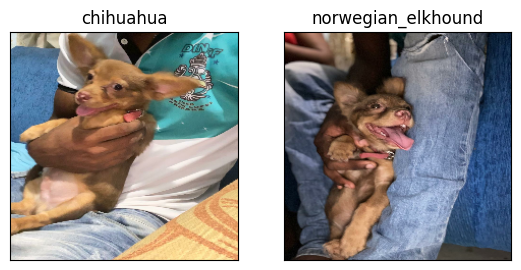

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)

  plt.xticks([])
  plt.yticks([])

  plt.title(list(map(get_pred_label, custom_preds))[i])
  plt.imshow(image)